In [ ]:
#Importing Libraries
import tensorflow as tf
import keras
import numpy as np 
import pandas as pd 
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adam, Adamax
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline
import sys
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
#!unzip /content/drive/MyDrive/midifiles.zip -d /content/drive/MyDrive/midifiles

In [ ]:
import os
os.listdir("../content/drive/MyDrive/midifiles/")

['albeniz',
 'bach',
 'balakir',
 'beeth',
 'borodin',
 'brahms',
 'burgm',
 'chopin',
 'debussy',
 'granados',
 'grieg',
 'haydn',
 'liszt',
 'mendelssohn',
 'mozart',
 'muss',
 'schubert',
 'schumann',
 'tschai']

We'd like to simulate music similar to beethoven's while expanding the existing dataset. This means we should use Beethoven's contemporaries that we have in the midifiles

Beethoven's contemporaries (in the directory list):

- Joseph Haydn
- Franz Liszt
- Wolfgang Amadeus Mozart
- Franz Schubert



In [ ]:
contemporary_list = ['beeth']

In [ ]:
import os
midi_list= []
for composer in contemporary_list:
  directory = f"../content/drive/MyDrive/midifiles/{composer}/"

  #gonna use music21's midi converter
  
  for filename in os.listdir(directory):
    try:
      f = os.path.join(directory, filename)
      midi = converter.parse(f)
      midi_list.append(midi)
    except KeyError:
      continue

In [ ]:
#we won't consider any
def extract_notes(file):
    notes = []
    pick = None
    for j in file:
      #using music21's partitioning to extract all the notes
        songs = instrument.partitionByInstrument(j)
        for part in songs.parts:
            section = part.recurse()
            for e in section:
                if isinstance(e, note.Note):
                  #standard note, defined by its pitch
                    notes.append(str(e.pitch))
                elif isinstance(e, chord.Chord):
                  #chords are defined as notes that are stacked on top of each other
                  #played at the same time, so we'll consider it as one 'note'
                    notes.append(".".join(str(n) for n in e.normalOrder))

    return notes

all_notes = extract_notes(midi_list)

#here just mapping all the characters to indices for easier access later
mapping = dict((note, i) for i, note in enumerate(sorted(list(set(all_notes)))))
reverse_mapping = dict((i, note) for i, note in enumerate(sorted(list(set(all_notes)))))

In [ ]:
x_list = list()
y_list = list()
#here we will define the dataset, we're going to use all the notes prior to a note to try to predict
#the note afterwards. Hopefully the LSTM model will understand some long term dependencies
#that defines a note after a note sequence
for i in range(0, len(all_notes) - 50):
    #past 50 notes
    x = all_notes[i:i + 50]
    #target note
    y_target = all_notes[i + 50]


    x_list.append([mapping[j] for j in x])
    y_list.append(mapping[y_target])


#going to use tensorflow's train test split method because it's way more convenient than creating a custom dataset in Torch

X = np.reshape(x_list, (len(y_list), 50 , 1))/float(len(mapping)) #normalizing features
y= np.eye(len(mapping), dtype='uint8')[y_list]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
#creating model using tensorflow is also much more convenient than torch, especially with LSTMs

model = Sequential()

#LSTM layer blocks, one LSTM layer, one dropout

model.add(LSTM(512, input_shape=(X.shape[1], X.shape[2]), return_sequences=True))
model.add(Dropout(0.1))

model.add(LSTM(256, return_sequences=True))
model.add(Dropout(0.1))

#last layer contains a fully connected layer before the output
model.add(LSTM(128))
model.add(Dense(128))
model.add(Dropout(0.25))

#use softmax activation for categorical
model.add(Dense(y.shape[1], activation='softmax'))

#since we're dealing with time series data, ADAM isn't too effective compared to Adamax, which is built for embeddings and time series learning
opt = Adamax(learning_rate=0.01)
model.compile(loss='categorical_crossentropy', optimizer=opt)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 50, 512)           1052672   
                                                                 
 dropout (Dropout)           (None, 50, 512)           0         
                                                                 
 lstm_1 (LSTM)               (None, 50, 256)           787456    
                                                                 
 dropout_1 (Dropout)         (None, 50, 256)           0         
                                                                 
 lstm_2 (LSTM)               (None, 128)               197120    
                                                                 
 dense (Dense)               (None, 128)               16512     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0

In [ ]:
#training and recording the history of the model
#easier done in tensorflow than in torch tbh
with tf.device('/device:GPU:0'):
  history = model.fit(X_train, y_train, batch_size=256, epochs=225)

Epoch 1/225
254/254 [==============================] - 23s 59ms/step - loss: 4.8540
Epoch 2/225
254/254 [==============================] - 15s 61ms/step - loss: 4.8070
Epoch 3/225
254/254 [==============================] - 15s 61ms/step - loss: 4.7974
Epoch 4/225
254/254 [==============================] - 15s 61ms/step - loss: 4.7913
Epoch 5/225
254/254 [==============================] - 15s 61ms/step - loss: 4.7836
Epoch 6/225
254/254 [==============================] - 15s 61ms/step - loss: 4.6882
Epoch 7/225
254/254 [==============================] - 15s 61ms/step - loss: 4.6568
Epoch 8/225
254/254 [==============================] - 15s 61ms/step - loss: 4.6425
Epoch 9/225
254/254 [==============================] - 15s 61ms/step - loss: 4.6318
Epoch 10/225
254/254 [==============================] - 15s 61ms/step - loss: 4.6143
Epoch 11/225
254/254 [==============================] - 15s 61ms/step - loss: 4.5906
Epoch 12/225
254/254 [==============================] - 15s 61ms/step - lo

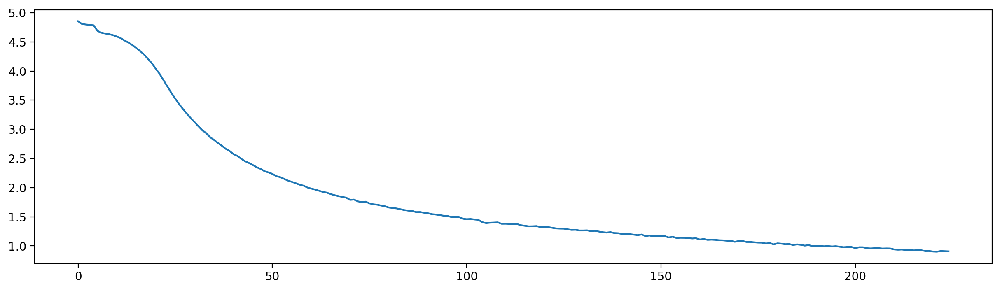

In [ ]:
#Plotting the learnings 
history_df = pd.DataFrame(history.history)
fig = plt.figure(figsize=(15,4))
plt.plot(history_df.loss)

In [ ]:
#calculate model perplexity

perplexity = np.exp(0.9061)
print(f"Model Perplexity: {perplexity}")

Model Perplexity: 2.474652544240156


In [ ]:
#here we create a midi stream based on the chord and notes as defined from the
#above cell
def parse_elements(segment):
    agg = []
    offset = 0
    for element in segment:
        if "." in element:
          #defined chords earlier with a -
            notes_in_chord = element.split(".") 
            notes = [] 
            for j in notes_in_chord:
              #define notes of a chord, then create the chord using a list
                inst_note = int(j)
                chord_note = note.Note(inst_note)            
                notes.append(chord_note)
                full_chord = chord.Chord(notes)
                #offset must increment
                full_chord.offset = offset
                agg.append(full_chord)
        else: 
          #these are individual notes
            ind_note = note.Note(element)
            ind_note.offset = offset
            agg.append(ind_note)
        #offset must be 1 more than the previous one or else notes will play together
        offset += 1
    out = stream.Stream(agg)   
    return out

In [ ]:
#this function can be probably done better, we might get better results if we change the seed every time with previous notes generated
#how to generate, we initialize with a random set of notes/chords from the test set

#then after every iteration we pop the top note and append the predicted note onto the back

def get_preds(x, model):
      prediction = model.predict(x, verbose=0)[0]
      exp_preds = np.exp(prediction)
      prediction = exp_preds / np.sum(exp_preds)
      index = np.argmax(prediction) 

      return index

def melody_gen(num_notes_generated):
  
    #draw a sample from test set
    rng = np.random.randint(0,len(X_test)-1)
    prev = X_test[rng]

    global music_out
    notes_gen = list()
    for i in range(num_notes_generated):
        
        #use test set sample (in 1st iter) to predict next note
        prev = prev.reshape(1, 50 ,1)
        pred = get_preds(prev, model)
        pred_mapped = pred/ float(len(mapping))
        notes_gen.append(pred)
        music_out = [reverse_mapping[char] for char in notes_gen]

        #append prediction to sample
        prev = np.append(prev,pred_mapped)

        #update sample
        prev = prev[1:]

    midi_out = stream.Stream(parse_elements(music_out))
    return midi_out

In [ ]:
out_midi = melody_gen(100)

In [ ]:
fp = out_midi.write('midi', fp="../content/drive/MyDrive/DeepLearning_FinalProject/out.mid")

In [ ]:
!pip install midi2audio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!apt-get install fluidsynth --assume-yes --fix-missing > /dev/null


In [ ]:
from midi2audio import FluidSynth

fs = FluidSynth()
input_filename = "../content/drive/MyDrive/DeepLearning_FinalProject/out.mid"
output_filename = "../content/drive/MyDrive/DeepLearning_FinalProject/out.wav"
fs.midi_to_audio(input_filename, output_filename)

In [ ]:
from IPython.display import Audio

Audio("../content/drive/MyDrive/DeepLearning_FinalProject/out.wav", rate=16000)

In [ ]:
checkpoint_path = "../content/drive/MyDrive/DeepLearning_FinalProject/weights_beethoven"
model.save_weights(checkpoint_path)